In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from prophet import Prophet
from sklearn.metrics import mean_squared_error, mean_absolute_error
plt.style.use('ggplot')
plt.style.use('fivethirtyeight')

In [2]:
import requests
import pandas as pd
import time

# EIA API Info
api_key = "G6Wiq6ZIMvI383jRwfAsrIG2W3GssLvXufFA7F9h"
base_url = "https://api.eia.gov/v2/electricity/rto/region-data/data/"
params = {
    "frequency": "hourly",
    "data[0]": "value",
    "facets[respondent][0]": "PJM",
    "start": "2019-01-01T00",
    "end": "2025-12-31T23",
    "sort[0][column]": "period",
    "sort[0][direction]": "asc",
    "api_key": api_key,
    "offset": 0,
    "length": 5000
}

# Loop to get all records
all_data = []
while True:
    response = requests.get(base_url, params=params)
    
    if response.status_code != 200:
        print("Error:", response.status_code)
        break
    
    json_data = response.json()
    batch = json_data.get("response", {}).get("data", [])
    
    if not batch:
        break

    all_data.extend(batch)
    params["offset"] += 5000  
    print(f"Fetched {len(all_data)} records...")
    time.sleep(0.5)  

df_all = pd.DataFrame(all_data)

df_demand = df_all[df_all["type"] == "D"].copy()



Fetched 5000 records...
Fetched 10000 records...
Fetched 15000 records...
Fetched 20000 records...
Fetched 25000 records...
Fetched 30000 records...
Fetched 35000 records...
Fetched 40000 records...
Fetched 45000 records...
Fetched 50000 records...
Fetched 55000 records...
Fetched 60000 records...
Fetched 65000 records...
Fetched 70000 records...
Fetched 75000 records...
Fetched 80000 records...
Fetched 85000 records...
Fetched 90000 records...
Fetched 95000 records...
Fetched 100000 records...
Fetched 105000 records...
Fetched 110000 records...
Fetched 115000 records...
Fetched 120000 records...
Fetched 125000 records...
Fetched 130000 records...
Fetched 135000 records...
Fetched 140000 records...
Fetched 145000 records...
Fetched 150000 records...
Fetched 155000 records...
Fetched 160000 records...
Fetched 165000 records...
Fetched 170000 records...
Fetched 175000 records...
Fetched 180000 records...
Fetched 185000 records...
Fetched 190000 records...
Fetched 195000 records...
Fetche

In [3]:
df_demand

,period,respondent,respondent-name,type,type-name,value,value-units
0,2019-01-01T00,PJM,"PJM Interconnection, LLC",D,Demand,94016,megawatthours
4,2019-01-01T01,PJM,"PJM Interconnection, LLC",D,Demand,90385,megawatthours
8,2019-01-01T02,PJM,"PJM Interconnection, LLC",D,Demand,86724,megawatthours
12,2019-01-01T03,PJM,"PJM Interconnection, LLC",D,Demand,82978,megawatthours
16,2019-01-01T04,PJM,"PJM Interconnection, LLC",D,Demand,79536,megawatthours
...,...,...,...,...,...,...,...
226749,2025-06-23T18,PJM,"PJM Interconnection, LLC",D,Demand,84962,megawatthours
226751,2025-06-23T19,PJM,"PJM Interconnection, LLC",D,Demand,84962,megawatthours
226753,2025-06-23T20,PJM,"PJM Interconnection, LLC",D,Demand,84962,megawatthours
226755,2025-06-23T21,PJM,"PJM Interconnection, LLC",D,Demand,84962,megawatthours


In [4]:
df_demand = df_demand[["period", "value"]].rename(columns={"period": "Datetime", "value": "PJM_MW (Electricity Demand)"})
print(df_demand.head())

         Datetime PJM_MW (Electricity Demand)
0   2019-01-01T00                       94016
4   2019-01-01T01                       90385
8   2019-01-01T02                       86724
12  2019-01-01T03                       82978
16  2019-01-01T04                       79536


# Check for Missing values

In [5]:
df_demand.isnull().sum()

Datetime                         0
PJM_MW (Electricity Demand)    116
dtype: int64

# Removing Missing Data

In [6]:
df_demand.dropna(inplace=True)

In [7]:
df_demand.isnull().sum()

Datetime                       0
PJM_MW (Electricity Demand)    0
dtype: int64

In [8]:
df_demand.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56666 entries, 0 to 226757
Data columns (total 2 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   Datetime                     56666 non-null  object
 1   PJM_MW (Electricity Demand)  56666 non-null  object
dtypes: object(2)
memory usage: 1.3+ MB


In [9]:
df_demand["Datetime"] = pd.to_datetime(df_demand["Datetime"])

In [10]:
df_demand.set_index('Datetime',inplace=True)

In [11]:
df_demand

,PJM_MW (Electricity Demand)
Datetime,
2019-01-01 00:00:00,94016
2019-01-01 01:00:00,90385
2019-01-01 02:00:00,86724
2019-01-01 03:00:00,82978
2019-01-01 04:00:00,79536
...,...
2025-06-23 18:00:00,84962
2025-06-23 19:00:00,84962
2025-06-23 20:00:00,84962


In [12]:
df_demand['PJM_MW (Electricity Demand)'] = pd.to_numeric(df_demand['PJM_MW (Electricity Demand)'], errors='coerce')

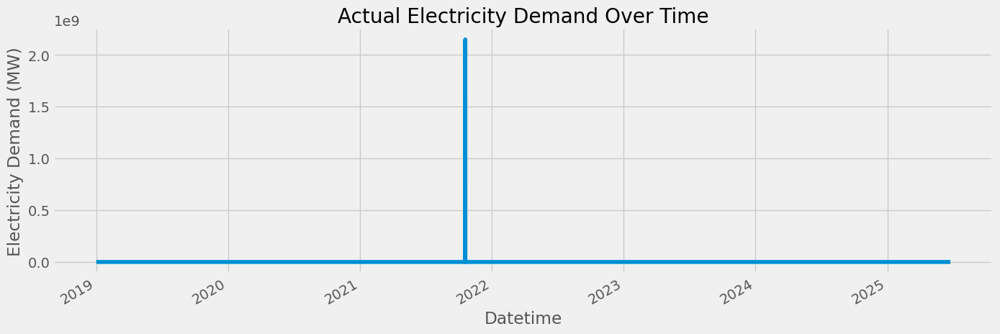

In [13]:
df_demand['PJM_MW (Electricity Demand)'].plot(figsize=(15, 5), title='Actual Electricity Demand Over Time')
plt.xlabel('Datetime')
plt.ylabel('Electricity Demand (MW)')
plt.grid(True)
plt.show()

In [14]:
import plotly.express as px
fig = px.line(df_demand, x=df_demand.index, y='PJM_MW (Electricity Demand)', title='Actual Electricity Demand Over Time')
fig.update_layout(xaxis_title='Date', yaxis_title='Electricity Demand (MW)')
fig.show()


In [15]:
df_demand['PJM_MW (Electricity Demand)'].sort_values(ascending=False).head(10)

Datetime
2021-10-19 04:00:00    2147480000
2021-10-19 03:00:00    1527760000
2021-10-19 05:00:00     431044000
2019-12-11 20:00:00        417669
2020-07-24 16:00:00        262651
2020-09-03 21:00:00        250825
2020-07-27 22:00:00        245799
2020-07-13 23:00:00        224345
2020-04-10 04:00:00        215682
2020-07-28 17:00:00        192229
Name: PJM_MW (Electricity Demand), dtype: int64

# Handle outliers Data 

In [16]:
Q1 = df_demand['PJM_MW (Electricity Demand)'].quantile(0.25)
Q3 = df_demand['PJM_MW (Electricity Demand)'].quantile(0.75)
IQR = Q3 - Q1
df_demand = df_demand[(df_demand['PJM_MW (Electricity Demand)'] >= Q1 - 1.5 * IQR) & (df_demand['PJM_MW (Electricity Demand)'] <= Q3 + 1.5 * IQR)]

In [17]:
df_demand.to_csv("clean_demand_data.csv")

In [18]:
import plotly.express as px
fig = px.line(df_demand, x=df_demand.index, y='PJM_MW (Electricity Demand)', title='Actual Electricity Demand Over Time')
fig.update_layout(xaxis_title='Date', yaxis_title='Electricity Demand (MW)')
fig.show()

# Create Calender Features from Time series data 

In [19]:
from pandas.api.types import CategoricalDtype

cat_type = CategoricalDtype(
    categories=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
    ordered=True
)

def create_time_features(df):
    df = df.copy()
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['weekday'] = df['date'].dt.day_name().astype(cat_type)
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.isocalendar().week.astype(int)
    df['date_offset'] = (df.date.dt.month * 100 + df.date.dt.day - 320) % 1300
    df['season'] = pd.cut(
    df['date_offset'],
    bins=[0, 300, 602, 900, 1300],
    labels=['Spring', 'Summer', 'Fall', 'Winter'],
    right=False,                  
    include_lowest=True            
)

    return df

df_features = create_time_features(df_demand)


In [20]:
df_features

,PJM_MW (Electricity Demand),date,hour,dayofweek,weekday,quarter,month,year,dayofyear,dayofmonth,weekofyear,date_offset,season
Datetime,,,,,,,,,,,,,
2019-01-01 00:00:00,94016,2019-01-01 00:00:00,0,1,Tuesday,1,1,2019,1,1,1,1081,Winter
2019-01-01 01:00:00,90385,2019-01-01 01:00:00,1,1,Tuesday,1,1,2019,1,1,1,1081,Winter
2019-01-01 02:00:00,86724,2019-01-01 02:00:00,2,1,Tuesday,1,1,2019,1,1,1,1081,Winter
2019-01-01 03:00:00,82978,2019-01-01 03:00:00,3,1,Tuesday,1,1,2019,1,1,1,1081,Winter
2019-01-01 04:00:00,79536,2019-01-01 04:00:00,4,1,Tuesday,1,1,2019,1,1,1,1081,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-23 18:00:00,84962,2025-06-23 18:00:00,18,0,Monday,2,6,2025,174,23,26,303,Summer
2025-06-23 19:00:00,84962,2025-06-23 19:00:00,19,0,Monday,2,6,2025,174,23,26,303,Summer
2025-06-23 20:00:00,84962,2025-06-23 20:00:00,20,0,Monday,2,6,2025,174,23,26,303,Summer


In [21]:
df_features.isnull().sum()

PJM_MW (Electricity Demand)    0
date                           0
hour                           0
dayofweek                      0
weekday                        0
quarter                        0
month                          0
year                           0
dayofyear                      0
dayofmonth                     0
weekofyear                     0
date_offset                    0
season                         0
dtype: int64

In [22]:
df_features.to_csv("df_features_data.csv")

# (Years Vs AEP_MW)

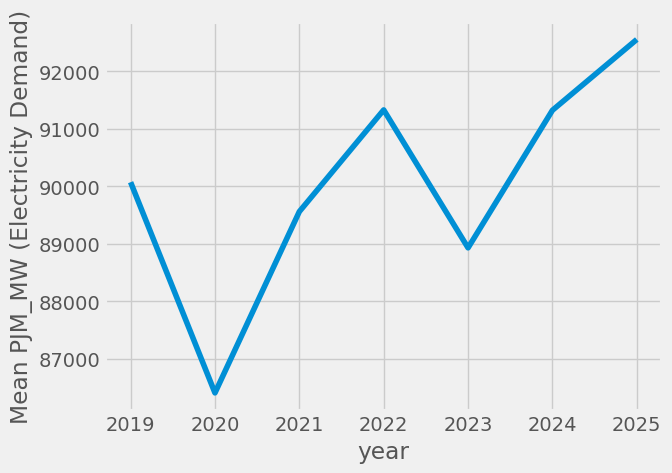

In [23]:
yearly_stats = df_features.groupby('year')['PJM_MW (Electricity Demand)'].mean()
yearly_stats.plot()
plt.ylabel('Mean PJM_MW (Electricity Demand)')
plt.show()

In [24]:
df_features.loc['2020']

,PJM_MW (Electricity Demand),date,hour,dayofweek,weekday,quarter,month,year,dayofyear,dayofmonth,weekofyear,date_offset,season
Datetime,,,,,,,,,,,,,
2020-01-01 00:00:00,96028,2020-01-01 00:00:00,0,2,Wednesday,1,1,2020,1,1,1,1081,Winter
2020-01-01 01:00:00,93365,2020-01-01 01:00:00,1,2,Wednesday,1,1,2020,1,1,1,1081,Winter
2020-01-01 02:00:00,90573,2020-01-01 02:00:00,2,2,Wednesday,1,1,2020,1,1,1,1081,Winter
2020-01-01 03:00:00,87907,2020-01-01 03:00:00,3,2,Wednesday,1,1,2020,1,1,1,1081,Winter
2020-01-01 04:00:00,85226,2020-01-01 04:00:00,4,2,Wednesday,1,1,2020,1,1,1,1081,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 19:00:00,91227,2020-12-31 19:00:00,19,3,Thursday,4,12,2020,366,31,53,911,Winter
2020-12-31 20:00:00,90853,2020-12-31 20:00:00,20,3,Thursday,4,12,2020,366,31,53,911,Winter
2020-12-31 21:00:00,91022,2020-12-31 21:00:00,21,3,Thursday,4,12,2020,366,31,53,911,Winter


In [25]:
df_features.loc['2020'].groupby('season')['PJM_MW (Electricity Demand)'].mean()

season
Spring    77191.872843
Summer    96626.746016
Fall      81863.188670
Winter    90800.156799
Name: PJM_MW (Electricity Demand), dtype: float64

<AxesSubplot:xlabel='season'>

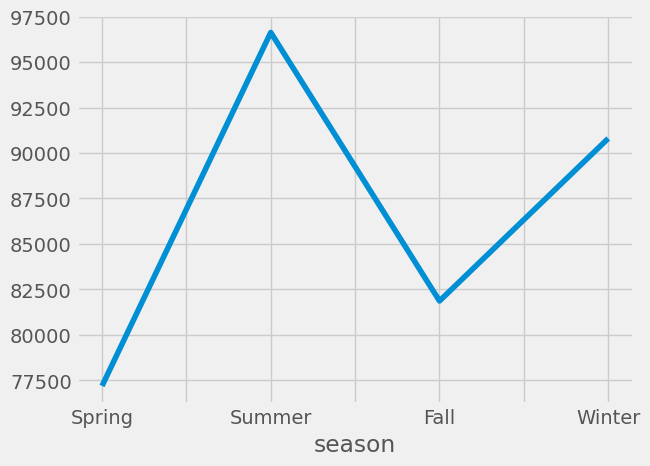

In [26]:
df_features.loc['2020'].groupby('season')['PJM_MW (Electricity Demand)'].mean().plot()

<AxesSubplot:xlabel='month'>

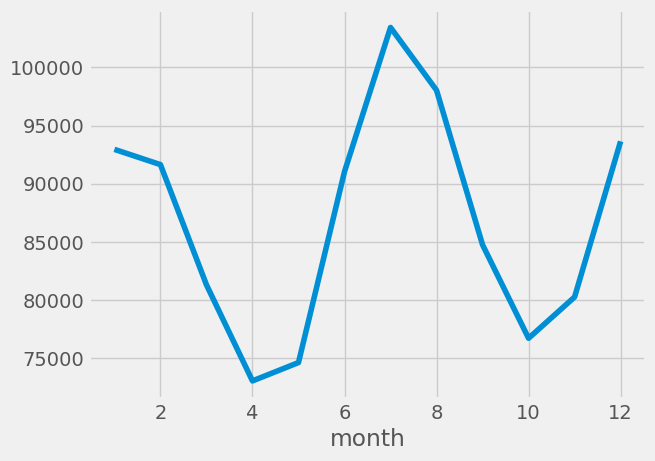

In [27]:
df_features.loc['2020'].groupby('month')['PJM_MW (Electricity Demand)'].mean().plot()

In [28]:
import plotly.express as px

year_season_stats = df_features.groupby(['year', 'season'])['PJM_MW (Electricity Demand)'].mean().reset_index()

fig = px.density_heatmap(
    year_season_stats,
    x='year',
    y='season',
    z='PJM_MW (Electricity Demand)',
    color_continuous_scale='Viridis',
    title='Average Electricity Demand by Season and Year',
    labels={'PJM_MW (Electricity Demand)': 'Mean Demand (MW)'}
)

fig.update_layout(template='plotly_white')
fig.show()


In [29]:
df_features.loc['2024'].groupby('season')['PJM_MW (Electricity Demand)'].mean()

season
Spring    85607.740028
Summer    99590.967565
Fall      86412.676966
Winter    94270.968475
Name: PJM_MW (Electricity Demand), dtype: float64

In [30]:
df_features.loc['2024'].groupby('season')['PJM_MW (Electricity Demand)'].mean()

season
Spring    85607.740028
Summer    99590.967565
Fall      86412.676966
Winter    94270.968475
Name: PJM_MW (Electricity Demand), dtype: float64

In [31]:
df_features.loc['2024'].groupby('season')['PJM_MW (Electricity Demand)'].mean().to_frame()

,PJM_MW (Electricity Demand)
season,
Spring,85607.740028
Summer,99590.967565
Fall,86412.676966
Winter,94270.968475


In [32]:
heat_data = df_features.loc['2024'].groupby('season')['PJM_MW (Electricity Demand)'].mean().to_frame().T

In [33]:
heat_data

season,Spring,Summer,Fall,Winter
PJM_MW (Electricity Demand),85607.740028,99590.967565,86412.676966,94270.968475


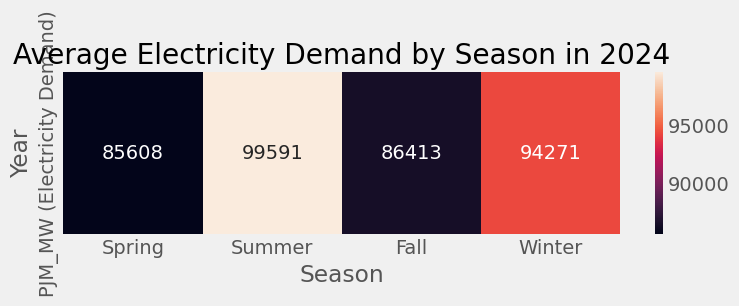

In [34]:
plt.figure(figsize=(8, 2))
sns.heatmap(heat_data, annot=True, fmt=".0f")
plt.title("Average Electricity Demand by Season in 2024")
plt.xlabel("Season")
plt.ylabel("Year")
plt.show()

# (Months Vs AEP_MW)

In [35]:
months_stats = df_features.groupby('month')['PJM_MW (Electricity Demand)'].agg(['max', 'min', 'mean'])
months_stats

,max,min,mean
month,,,
1,128423,67231,99270.148228
2,128411,73092,95730.463661
3,120826,62229,85612.224037
4,106580,59212,78606.949196
5,124526,58480,81079.433295
6,128454,60885,93115.314506
7,128443,66802,102544.163038
8,128421,66065,100002.702776
9,128365,61340,88604.455376


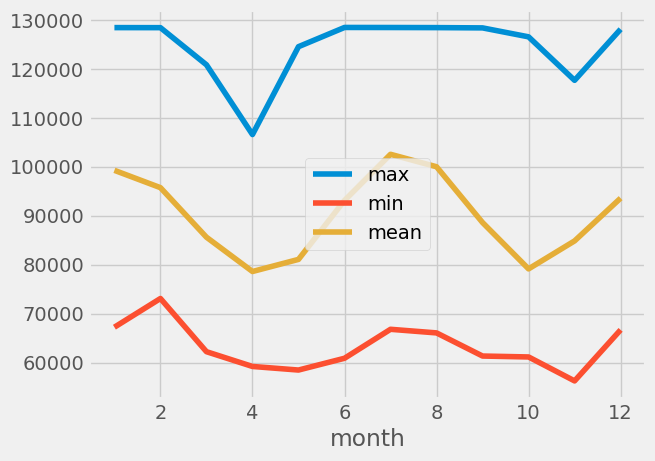

In [36]:
months_stats.plot()
plt.show()

# (Hours Vs AEP_MW)

In [37]:
hours_stats = df_features.groupby('hour')['PJM_MW (Electricity Demand)'].agg(['max', 'min', 'mean'])
hours_stats

,max,min,mean
hour,,,
0,128328,69652,97945.478571
1,128349,71344,97513.805229
2,128430,69471,95528.732219
3,128415,66512,91725.247239
4,127645,63714,87594.475584
5,127950,61521,84134.756780
6,126391,60399,81437.032995
7,125429,59587,79733.401948
8,125418,59078,78859.193139


<AxesSubplot:xlabel='hour'>

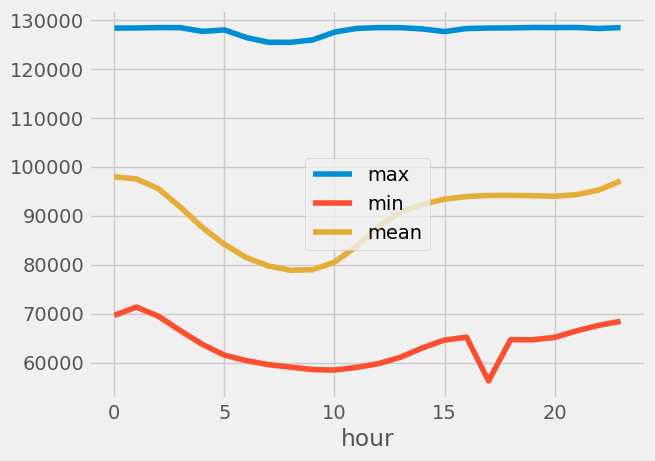

In [38]:
hours_stats.plot()

# (Seasons Vs AEP_MW)

In [39]:
season_stats = df_features.groupby('season')['PJM_MW (Electricity Demand)'].mean()
season_stats

season
Spring    82426.020098
Summer    98338.568416
Fall      84671.010795
Winter    94877.294853
Name: PJM_MW (Electricity Demand), dtype: float64

<AxesSubplot:xlabel='season'>

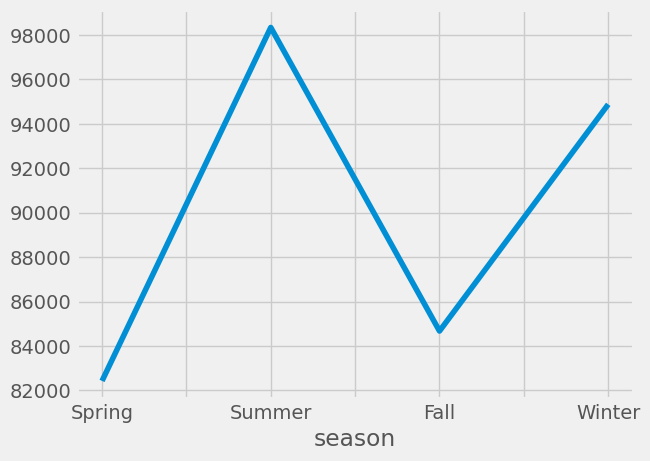

In [40]:
season_stats.plot()

# (Weekdays Vs AEP_MW)

In [41]:
weekday_stats = df_features.groupby('weekday')['PJM_MW (Electricity Demand)'].mean()
weekday_stats

weekday
Monday       89899.772855
Tuesday      91600.533624
Wednesday    91971.147944
Thursday     91940.680713
Friday       91354.455612
Saturday     87093.638913
Sunday       85010.958668
Name: PJM_MW (Electricity Demand), dtype: float64

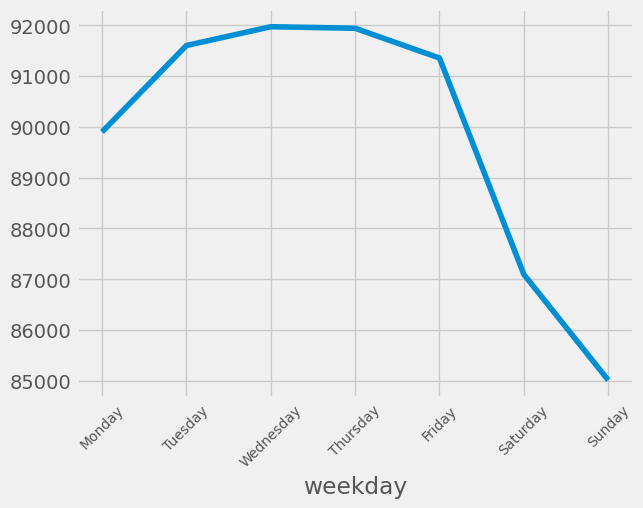

In [42]:
weekday_stats.plot()
plt.xticks(rotation=45, fontsize=10)
plt.show()

# (dayofmonths Vs AEP_MW)

In [43]:
dayofmonth_stats = df_features.groupby('dayofmonth')['PJM_MW (Electricity Demand)'].mean()
dayofmonth_stats

dayofmonth
1     88829.507325
2     89539.451193
3     89575.077936
4     89889.487013
5     89616.809444
6     90355.400222
7     90333.627054
8     90028.048378
9     89651.413151
10    88934.887168
11    89067.132240
12    89405.484384
13    90023.232429
14    90531.967105
15    90424.475231
16    89739.159215
17    89816.859803
18    90440.403605
19    91010.144426
20    91531.147043
21    91890.512849
22    91480.548173
23    89854.232367
24    88922.264381
25    88405.633943
26    88678.768503
27    88756.887269
28    88856.137620
29    89746.776308
30    89586.240172
31    89173.448145
Name: PJM_MW (Electricity Demand), dtype: float64

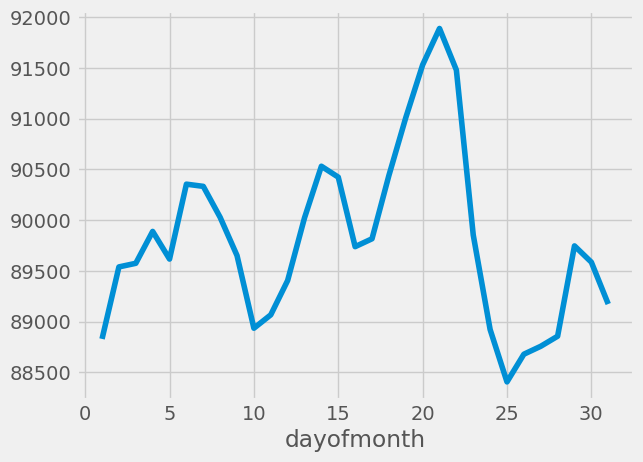

In [44]:
dayofmonth_stats.plot()
plt.show()

# (weekofyear Vs AEP_MW)

In [45]:
weekofyear_stats = df_features.groupby('weekofyear')['PJM_MW (Electricity Demand)'].mean()
weekofyear_stats

weekofyear
1      93357.210069
2      99354.852891
3     102168.775214
4     102540.655357
5     100260.558140
6      94628.735544
7      97235.457483
8      94637.910562
9      90394.033163
10     89517.766222
11     84442.322997
12     83811.164116
13     82328.852041
14     80007.490646
15     78180.270638
16     78220.111395
17     77147.276361
18     78633.710884
19     78847.729592
20     82108.361395
21     82858.207483
22     86177.028229
23     90615.504296
24     90639.303509
25     95287.412727
26     99301.945607
27    101203.133702
28    103526.508393
29    103372.808696
30    102616.980392
31    101725.634459
32    100727.979615
33    101003.677116
34     98854.853231
35     96628.525460
36     91973.806352
37     91983.429293
38     85958.335317
39     82392.884921
40     82732.145833
41     77837.860119
42     77984.216915
43     78265.102183
44     81190.024267
45     81364.825000
46     86922.472222
47     86619.451389
48     87841.176587
49     93745.672619
50     94

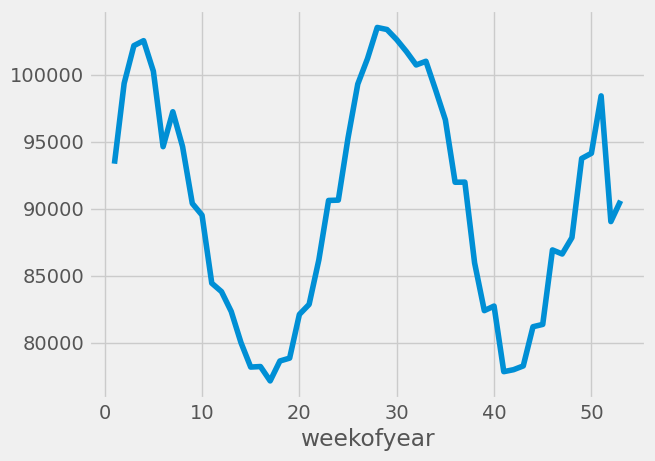

In [46]:
weekofyear_stats.plot()
plt.show()

# (dayofweek Vs AEP_MW)

In [47]:
dayofweek_stats = df_features.groupby('dayofweek')['PJM_MW (Electricity Demand)'].mean()
dayofweek_stats

dayofweek
0    89899.772855
1    91600.533624
2    91971.147944
3    91940.680713
4    91354.455612
5    87093.638913
6    85010.958668
Name: PJM_MW (Electricity Demand), dtype: float64

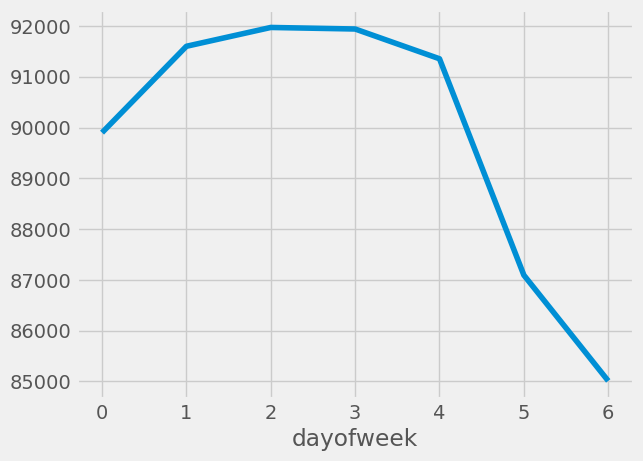

In [48]:
dayofweek_stats.plot()
plt.show()

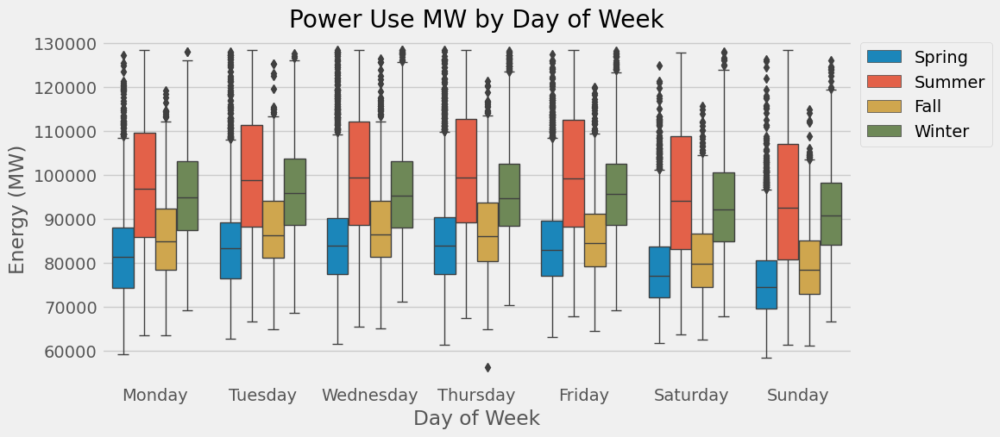

In [49]:
fig, ax = plt.subplots(figsize=(10, 5))
sns.boxplot(data=df_features, x = 'weekday', y = 'PJM_MW (Electricity Demand)', hue='season', ax=ax , linewidth=1)
ax.set_title('Power Use MW by Day of Week')
ax.set_xlabel('Day of Week')
ax.set_ylabel('Energy (MW)')
ax.legend(bbox_to_anchor=(1, 1))
plt.show()

In [50]:
df_features

,PJM_MW (Electricity Demand),date,hour,dayofweek,weekday,quarter,month,year,dayofyear,dayofmonth,weekofyear,date_offset,season
Datetime,,,,,,,,,,,,,
2019-01-01 00:00:00,94016,2019-01-01 00:00:00,0,1,Tuesday,1,1,2019,1,1,1,1081,Winter
2019-01-01 01:00:00,90385,2019-01-01 01:00:00,1,1,Tuesday,1,1,2019,1,1,1,1081,Winter
2019-01-01 02:00:00,86724,2019-01-01 02:00:00,2,1,Tuesday,1,1,2019,1,1,1,1081,Winter
2019-01-01 03:00:00,82978,2019-01-01 03:00:00,3,1,Tuesday,1,1,2019,1,1,1,1081,Winter
2019-01-01 04:00:00,79536,2019-01-01 04:00:00,4,1,Tuesday,1,1,2019,1,1,1,1081,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-23 18:00:00,84962,2025-06-23 18:00:00,18,0,Monday,2,6,2025,174,23,26,303,Summer
2025-06-23 19:00:00,84962,2025-06-23 19:00:00,19,0,Monday,2,6,2025,174,23,26,303,Summer
2025-06-23 20:00:00,84962,2025-06-23 20:00:00,20,0,Monday,2,6,2025,174,23,26,303,Summer


# Train / Test Split

In [51]:
split_date = '2024-07-01'
df_train = df_demand.loc[df_demand.index < split_date]
df_test = df_demand.loc[df_demand.index >= split_date]

# Trainning Data 

In [52]:
df_train

,PJM_MW (Electricity Demand)
Datetime,
2019-01-01 00:00:00,94016
2019-01-01 01:00:00,90385
2019-01-01 02:00:00,86724
2019-01-01 03:00:00,82978
2019-01-01 04:00:00,79536
...,...
2024-06-30 19:00:00,116825
2024-06-30 20:00:00,119214
2024-06-30 21:00:00,120942


# Testing Data

In [53]:
df_test

,PJM_MW (Electricity Demand)
Datetime,
2024-07-01 00:00:00,114253
2024-07-01 01:00:00,109243
2024-07-01 02:00:00,105028
2024-07-01 03:00:00,99200
2024-07-01 04:00:00,93301
...,...
2025-06-23 18:00:00,84962
2025-06-23 19:00:00,84962
2025-06-23 20:00:00,84962


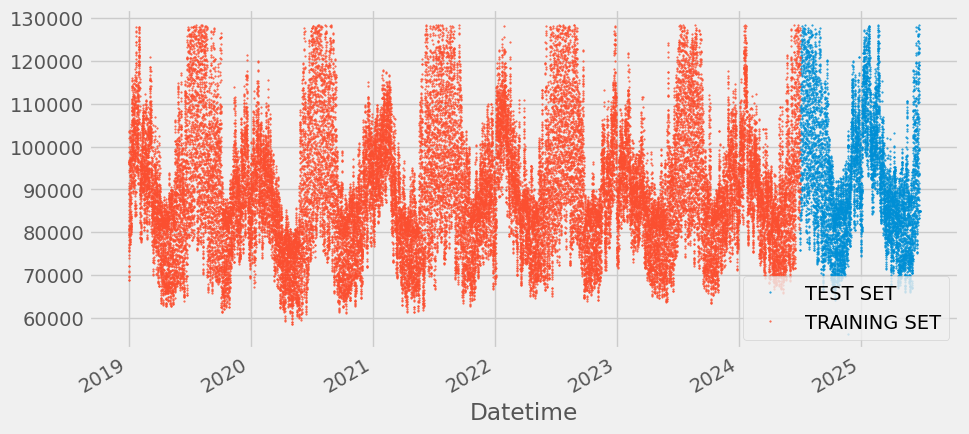

In [54]:
df_test.rename(columns={'PJM_MW (Electricity Demand)': 'TEST SET'}).join(df_train.rename(columns={'PJM_MW (Electricity Demand)': 'TRAINING SET'}),how='outer')\
.plot(figsize=(10, 5), style='.', ms=1)
plt.show()

# How do I Format data for prophet model using ds and y

In [55]:
df_train_prophet = df_train.reset_index().rename(columns={'Datetime':'ds','PJM_MW (Electricity Demand)':'y'})

In [56]:
df_train_prophet

,ds,y
0,2019-01-01 00:00:00,94016
1,2019-01-01 01:00:00,90385
2,2019-01-01 02:00:00,86724
3,2019-01-01 03:00:00,82978
4,2019-01-01 04:00:00,79536
...,...,...
46888,2024-06-30 19:00:00,116825
46889,2024-06-30 20:00:00,119214
46890,2024-06-30 21:00:00,120942
46891,2024-06-30 22:00:00,120641


In [57]:
%%time
model = Prophet()
model.fit(df_train_prophet)

02:07:33 - cmdstanpy - INFO - Chain [1] start processing
02:08:01 - cmdstanpy - INFO - Chain [1] done processing


Wall time: 34 s


In [58]:
# Predict on test set with model
df_test_prophet = df_test.reset_index().rename(columns={'Datetime':'ds','PJM_MW (Electricity Demand)':'y'})

df_test_fcst = model.predict(df_test_prophet)

In [59]:
df_test_fcst

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2024-07-01 00:00:00,94440.263825,101045.421389,120760.870293,94440.263825,94440.263825,16148.552231,16148.552231,16148.552231,8522.770040,...,-3289.252947,-3289.252947,-3289.252947,10915.035138,10915.035138,10915.035138,0.0,0.0,0.0,110588.816056
1,2024-07-01 01:00:00,94440.990830,100592.871927,119611.152658,94440.990830,94440.990830,15784.852485,15784.852485,15784.852485,7836.100914,...,-2990.948010,-2990.948010,-2990.948010,10939.699581,10939.699581,10939.699581,0.0,0.0,0.0,110225.843315
2,2024-07-01 02:00:00,94441.717835,97394.650849,118303.951493,94441.717835,94441.717835,13529.091546,13529.091546,13529.091546,5251.726603,...,-2686.990854,-2686.990854,-2686.990854,10964.355797,10964.355797,10964.355797,0.0,0.0,0.0,107970.809381
3,2024-07-01 03:00:00,94442.444840,93700.493295,114753.134256,94442.444840,94442.444840,9974.661539,9974.661539,9974.661539,1364.844179,...,-2379.186087,-2379.186087,-2379.186087,10989.003446,10989.003446,10989.003446,0.0,0.0,0.0,104417.106379
4,2024-07-01 04:00:00,94443.171846,90536.054700,110366.185595,94443.171846,94443.171846,6194.741927,6194.741927,6194.741927,-2749.564463,...,-2069.335801,-2069.335801,-2069.335801,11013.642191,11013.642191,11013.642191,0.0,0.0,0.0,100637.913773
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8316,2025-06-23 18:00:00,100682.330874,90085.621987,141278.292414,78220.135543,127136.718482,12980.280402,12980.280402,12980.280402,4759.414666,...,1605.407276,1605.407276,1605.407276,6615.458461,6615.458461,6615.458461,0.0,0.0,0.0,113662.611277
8317,2025-06-23 19:00:00,100683.057879,89610.084819,141796.933213,78212.403778,127147.700647,13281.882216,13281.882216,13281.882216,4869.952436,...,1774.468779,1774.468779,1774.468779,6637.461001,6637.461001,6637.461001,0.0,0.0,0.0,113964.940096
8318,2025-06-23 20:00:00,100683.784885,90266.457691,142880.665522,78204.672013,127158.682812,13445.070718,13445.070718,13445.070718,4857.756649,...,1927.821578,1927.821578,1927.821578,6659.492492,6659.492492,6659.492492,0.0,0.0,0.0,114128.855603
8319,2025-06-23 21:00:00,100684.511890,89305.585186,142804.249152,78196.940248,127169.664978,13937.540267,13937.540267,13937.540267,5190.532866,...,2065.454527,2065.454527,2065.454527,6681.552875,6681.552875,6681.552875,0.0,0.0,0.0,114622.052157


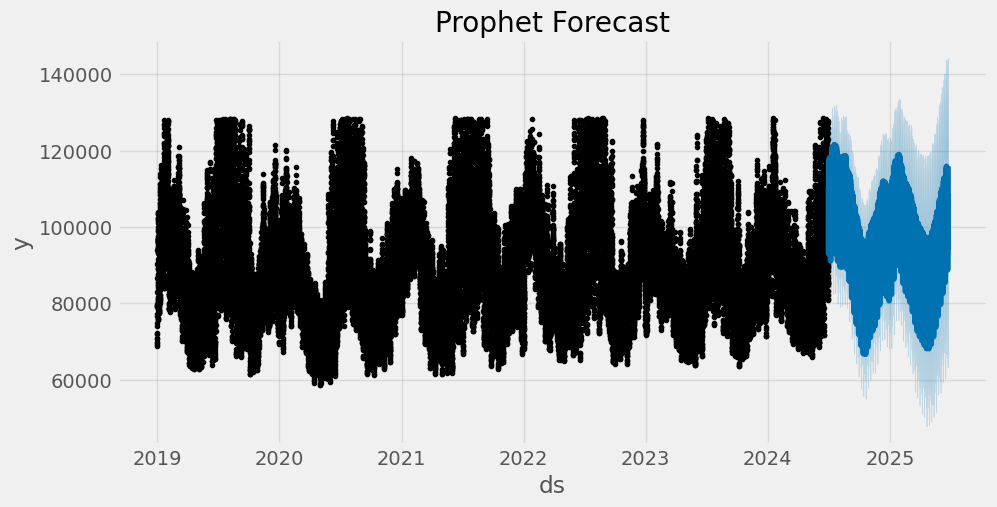

In [60]:
fig, ax = plt.subplots(figsize=(10, 5))
fig = model.plot(df_test_fcst, ax=ax)
ax.set_title('Prophet Forecast')
plt.show()

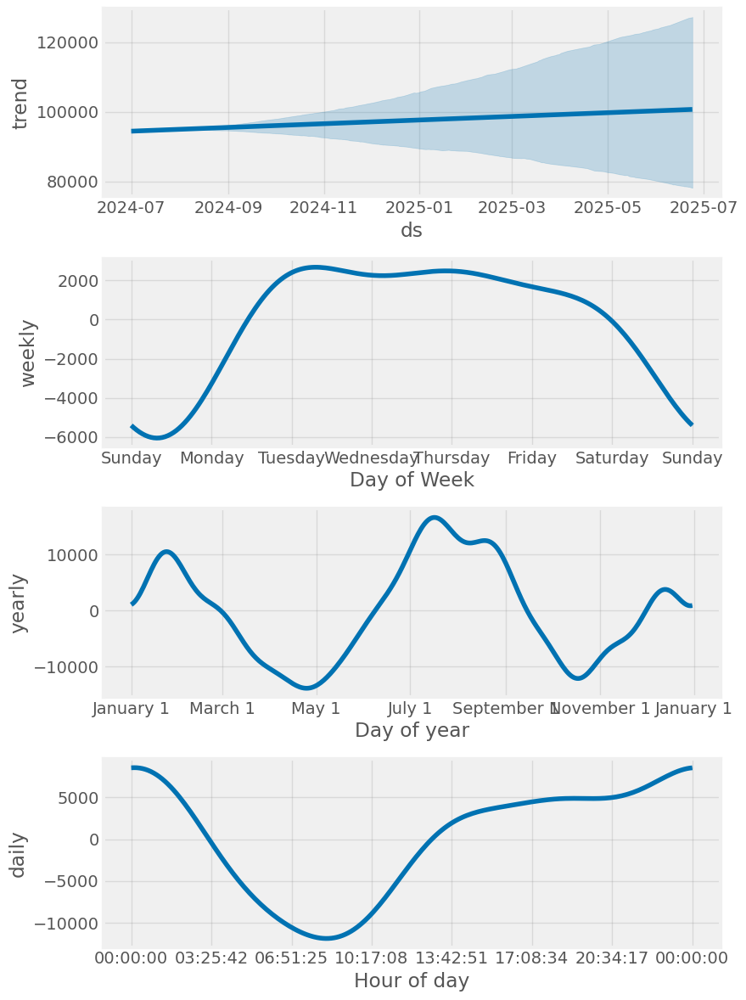

In [61]:
fig = model.plot_components(df_test_fcst)
plt.show()

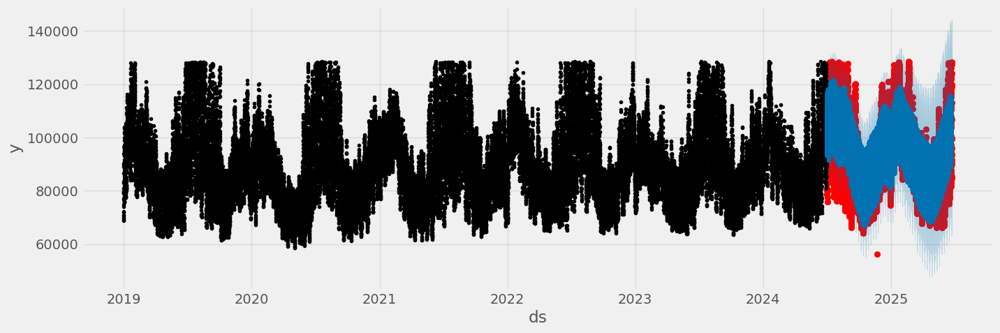

In [62]:
# Plot the forecast with the actuals
f, ax = plt.subplots(figsize=(15, 5))
ax.scatter(df_test.index, df_test['PJM_MW (Electricity Demand)'], color='r')
fig = model.plot(df_test_fcst, ax=ax)

In [63]:
df_test

,PJM_MW (Electricity Demand)
Datetime,
2024-07-01 00:00:00,114253
2024-07-01 01:00:00,109243
2024-07-01 02:00:00,105028
2024-07-01 03:00:00,99200
2024-07-01 04:00:00,93301
...,...
2025-06-23 18:00:00,84962
2025-06-23 19:00:00,84962
2025-06-23 20:00:00,84962


# Evaluate the model with Error Metrics

In [64]:
np.sqrt(mean_squared_error(y_true=df_test['PJM_MW (Electricity Demand)'],
                   y_pred=df_test_fcst['yhat']))

9785.410799847405

In [65]:
mean_absolute_error(y_true=df_test['PJM_MW (Electricity Demand)'],
                   y_pred=df_test_fcst['yhat'])

8137.81969292808

In [66]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mean_absolute_percentage_error(y_true=df_test['PJM_MW (Electricity Demand)'],
                   y_pred=df_test_fcst['yhat'])

9.104040491655597

# Adding Holidays

In [67]:
from pandas.tseries.holiday import USFederalHolidayCalendar as calendar

cal = calendar()


holidays = cal.holidays(start=df_features.index.min(),
                        end=df_features.index.max(),
                        return_name=True)
holiday_df = pd.DataFrame(data=holidays,
                          columns=['holiday'])
holiday_df = holiday_df.reset_index().rename(columns={'index':'ds'})

In [68]:
holiday_df

,ds,holiday
0,2019-01-01,New Year's Day
1,2019-01-21,"Birthday of Martin Luther King, Jr."
2,2019-02-18,Washington’s Birthday
3,2019-05-27,Memorial Day
4,2019-07-04,Independence Day
...,...,...
64,2025-01-01,New Year's Day
65,2025-01-20,"Birthday of Martin Luther King, Jr."
66,2025-02-17,Washington’s Birthday
67,2025-05-26,Memorial Day


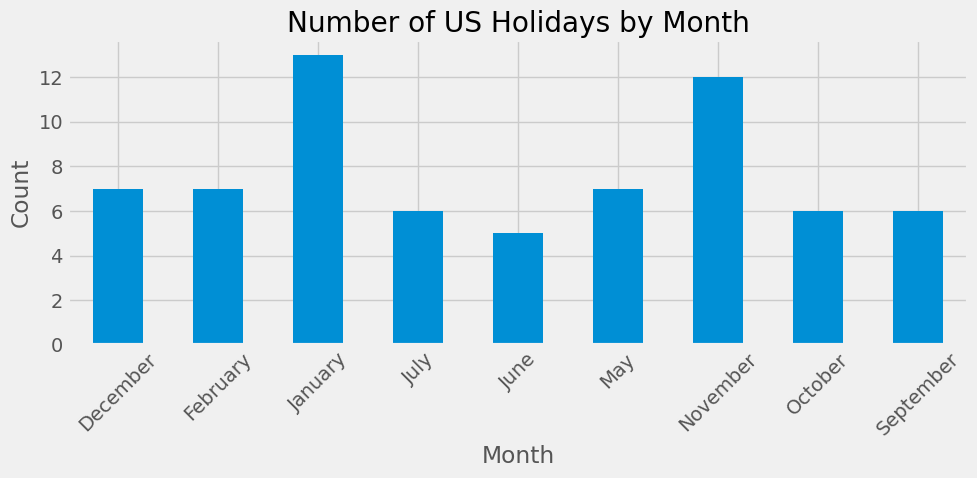

In [69]:
import pandas as pd
import matplotlib.pyplot as plt

holiday_df['month'] = holiday_df['ds'].dt.month_name()

monthly_counts = holiday_df['month'].value_counts().sort_index()

monthly_counts.plot(kind='bar', figsize=(10, 5))
plt.title('Number of US Holidays by Month')
plt.xlabel('Month')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [70]:
df_demand.reset_index()

,Datetime,PJM_MW (Electricity Demand)
0,2019-01-01 00:00:00,94016
1,2019-01-01 01:00:00,90385
2,2019-01-01 02:00:00,86724
3,2019-01-01 03:00:00,82978
4,2019-01-01 04:00:00,79536
...,...,...
55209,2025-06-23 18:00:00,84962
55210,2025-06-23 19:00:00,84962
55211,2025-06-23 20:00:00,84962
55212,2025-06-23 21:00:00,84962


In [71]:
%%time
model_with_holidays = Prophet(holidays=holiday_df)
model_with_holidays.fit(df_train_prophet)

02:08:12 - cmdstanpy - INFO - Chain [1] start processing
02:08:42 - cmdstanpy - INFO - Chain [1] done processing


Wall time: 36 s


In [72]:
# Predict on training set with model
df_test_fcst_with_hols = model_with_holidays.predict(df=df_test_prophet)

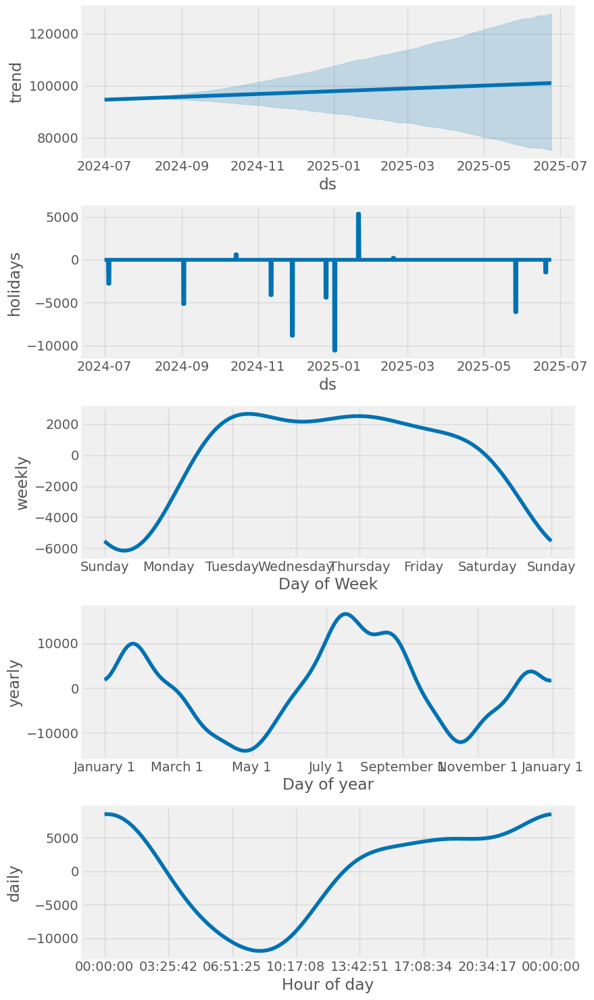

In [73]:
fig = model_with_holidays.plot_components(df_test_fcst_with_hols)
plt.show()

# Evaluate the model with Error Metrics After Adding Holidays

In [74]:
np.sqrt(mean_squared_error(y_true=df_test['PJM_MW (Electricity Demand)'],
                   y_pred=df_test_fcst_with_hols['yhat']))

9800.844564456851

In [75]:
mean_absolute_error(y_true=df_test['PJM_MW (Electricity Demand)'],
                   y_pred=df_test_fcst_with_hols['yhat'])

8153.961554078368

In [76]:
mean_absolute_percentage_error(y_true=df_test['PJM_MW (Electricity Demand)'],
                   y_pred=df_test_fcst_with_hols['yhat'])

9.135200578601047

# Predict into the Future

In [77]:
future = model.make_future_dataframe(periods=365*24, freq='h', include_history=False)
future 

,ds
0,2024-07-01 00:00:00
1,2024-07-01 01:00:00
2,2024-07-01 02:00:00
3,2024-07-01 03:00:00
4,2024-07-01 04:00:00
...,...
8755,2025-06-30 19:00:00
8756,2025-06-30 20:00:00
8757,2025-06-30 21:00:00
8758,2025-06-30 22:00:00


In [78]:
forecast = model_with_holidays.predict(future)
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,"Birthday of Martin Luther King, Jr.","Birthday of Martin Luther King, Jr._lower","Birthday of Martin Luther King, Jr._upper",Christmas Day,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2024-07-01 00:00:00,94616.133517,100935.660169,120687.733715,94616.133517,94616.133517,0.0,0.0,0.0,0.0,...,-3239.197315,-3239.197315,-3239.197315,11022.437708,11022.437708,11022.437708,0.0,0.0,0.0,110923.175435
1,2024-07-01 01:00:00,94616.876504,100367.393618,120367.557102,94616.876504,94616.876504,0.0,0.0,0.0,0.0,...,-2931.158848,-2931.158848,-2931.158848,11047.385439,11047.385439,11047.385439,0.0,0.0,0.0,110569.418424
2,2024-07-01 02:00:00,94617.619492,98309.739907,118794.358495,94617.619492,94617.619492,0.0,0.0,0.0,0.0,...,-2618.002842,-2618.002842,-2618.002842,11072.319049,11072.319049,11072.319049,0.0,0.0,0.0,108322.902547
3,2024-07-01 03:00:00,94618.362479,95361.612692,115077.685238,94618.362479,94618.362479,0.0,0.0,0.0,0.0,...,-2301.606268,-2301.606268,-2301.606268,11097.238189,11097.238189,11097.238189,0.0,0.0,0.0,104777.426867
4,2024-07-01 04:00:00,94619.105466,91056.495033,110406.238815,94619.105466,94619.105466,0.0,0.0,0.0,0.0,...,-1983.838454,-1983.838454,-1983.838454,11122.142510,11122.142510,11122.142510,0.0,0.0,0.0,101006.349083
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,2025-06-30 19:00:00,101120.987139,90486.111087,146837.167721,74366.156567,128013.281949,0.0,0.0,0.0,0.0,...,1873.690127,1873.690127,1873.690127,10747.179687,10747.179687,10747.179687,0.0,0.0,0.0,118613.462106
8756,2025-06-30 20:00:00,101121.730126,90323.970919,146765.637106,74357.414457,128016.764998,0.0,0.0,0.0,0.0,...,2020.985976,2020.985976,2020.985976,10772.259942,10772.259942,10772.259942,0.0,0.0,0.0,118774.124623
8757,2025-06-30 21:00:00,101122.473113,91495.442538,149322.534289,74348.672348,128020.248046,0.0,0.0,0.0,0.0,...,2151.897362,2151.897362,2151.897362,10797.329864,10797.329864,10797.329864,0.0,0.0,0.0,119263.502088
8758,2025-06-30 22:00:00,101123.216101,91157.264900,147730.281442,74339.930238,128023.731095,0.0,0.0,0.0,0.0,...,2266.617862,2266.617862,2266.617862,10822.389112,10822.389112,10822.389112,0.0,0.0,0.0,120430.196052


In [79]:
forecast[['ds','yhat']].head()

,ds,yhat
0,2024-07-01 00:00:00,110923.175435
1,2024-07-01 01:00:00,110569.418424
2,2024-07-01 02:00:00,108322.902547
3,2024-07-01 03:00:00,104777.426867
4,2024-07-01 04:00:00,101006.349083


In [80]:
test_periods = len(df_test)
future = model.make_future_dataframe(periods=test_periods, freq='H', include_history=False)
forecast = model.predict(future)
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2024-07-01 00:00:00,94440.263825,100384.410612,121056.188067,94440.263825,94440.263825,16148.552231,16148.552231,16148.552231,8522.770040,...,-3289.252947,-3289.252947,-3289.252947,10915.035138,10915.035138,10915.035138,0.0,0.0,0.0,110588.816056
1,2024-07-01 01:00:00,94440.990830,100347.831234,119415.683362,94440.990830,94440.990830,15784.852485,15784.852485,15784.852485,7836.100914,...,-2990.948010,-2990.948010,-2990.948010,10939.699581,10939.699581,10939.699581,0.0,0.0,0.0,110225.843315
2,2024-07-01 02:00:00,94441.717835,98050.279164,118470.612643,94441.717835,94441.717835,13529.091546,13529.091546,13529.091546,5251.726603,...,-2686.990854,-2686.990854,-2686.990854,10964.355797,10964.355797,10964.355797,0.0,0.0,0.0,107970.809381
3,2024-07-01 03:00:00,94442.444840,94739.217010,114620.868353,94442.444840,94442.444840,9974.661539,9974.661539,9974.661539,1364.844179,...,-2379.186087,-2379.186087,-2379.186087,10989.003446,10989.003446,10989.003446,0.0,0.0,0.0,104417.106379
4,2024-07-01 04:00:00,94443.171846,90837.806377,111827.290563,94443.171846,94443.171846,6194.741927,6194.741927,6194.741927,-2749.564463,...,-2069.335801,-2069.335801,-2069.335801,11013.642191,11013.642191,11013.642191,0.0,0.0,0.0,100637.913773
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8316,2025-06-12 12:00:00,100486.039457,76641.974014,128034.193066,77446.805584,123777.390690,1005.921158,1005.921158,1005.921158,-2773.924309,...,2153.761399,2153.761399,2153.761399,1626.084068,1626.084068,1626.084068,0.0,0.0,0.0,101491.960615
8317,2025-06-12 13:00:00,100486.766463,79608.611002,130512.002780,77441.904361,123780.811031,4139.609252,4139.609252,4139.609252,384.872288,...,2112.524191,2112.524191,2112.524191,1642.212774,1642.212774,1642.212774,0.0,0.0,0.0,104626.375715
8318,2025-06-12 14:00:00,100487.493468,83372.176574,133394.484733,77437.003139,123784.231371,6116.803728,6116.803728,6116.803728,2387.908807,...,2070.547265,2070.547265,2070.547265,1658.347656,1658.347656,1658.347656,0.0,0.0,0.0,106604.297196
8319,2025-06-12 15:00:00,100488.220473,81684.676532,133174.025065,77432.101917,123787.651711,7087.668629,7087.668629,7087.668629,3385.009655,...,2028.170131,2028.170131,2028.170131,1674.488843,1674.488843,1674.488843,0.0,0.0,0.0,107575.889102


In [81]:
df_compare = forecast[['ds', 'yhat']].copy()
df_compare['y_actual'] = df_test['PJM_MW (Electricity Demand)'].values

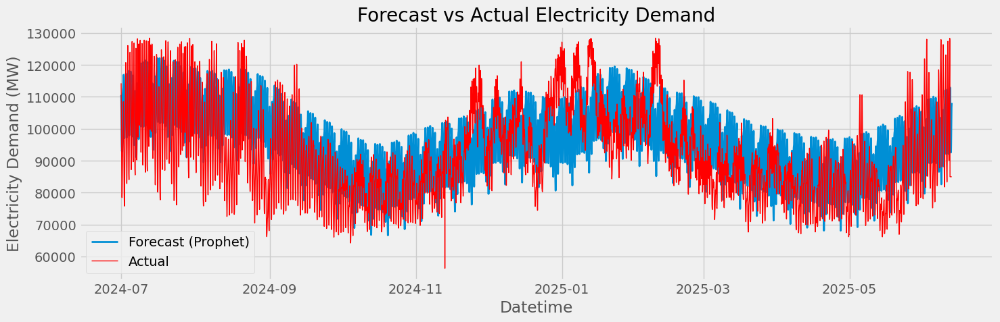

In [82]:
plt.figure(figsize=(15, 5))
plt.plot(df_compare['ds'], df_compare['yhat'], label='Forecast (Prophet)', linewidth=2)
plt.plot(df_compare['ds'], df_compare['y_actual'], label='Actual', color='red', linewidth=1)
plt.xlabel('Datetime')
plt.ylabel('Electricity Demand (MW)')
plt.title('Forecast vs Actual Electricity Demand')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# XGBOOST

In [83]:
from sklearn.preprocessing import LabelEncoder
df_features['weekday'] = LabelEncoder().fit_transform(df_features['weekday'])
df_features['season'] = LabelEncoder().fit_transform(df_features['season'])

In [84]:
df_features

,PJM_MW (Electricity Demand),date,hour,dayofweek,weekday,quarter,month,year,dayofyear,dayofmonth,weekofyear,date_offset,season
Datetime,,,,,,,,,,,,,
2019-01-01 00:00:00,94016,2019-01-01 00:00:00,0,1,5,1,1,2019,1,1,1,1081,3
2019-01-01 01:00:00,90385,2019-01-01 01:00:00,1,1,5,1,1,2019,1,1,1,1081,3
2019-01-01 02:00:00,86724,2019-01-01 02:00:00,2,1,5,1,1,2019,1,1,1,1081,3
2019-01-01 03:00:00,82978,2019-01-01 03:00:00,3,1,5,1,1,2019,1,1,1,1081,3
2019-01-01 04:00:00,79536,2019-01-01 04:00:00,4,1,5,1,1,2019,1,1,1,1081,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-23 18:00:00,84962,2025-06-23 18:00:00,18,0,1,2,6,2025,174,23,26,303,2
2025-06-23 19:00:00,84962,2025-06-23 19:00:00,19,0,1,2,6,2025,174,23,26,303,2
2025-06-23 20:00:00,84962,2025-06-23 20:00:00,20,0,1,2,6,2025,174,23,26,303,2


In [85]:
X = df_features.drop(columns=['PJM_MW (Electricity Demand)','date'])  
y = df_features['PJM_MW (Electricity Demand)']  

In [86]:
X

,hour,dayofweek,weekday,quarter,month,year,dayofyear,dayofmonth,weekofyear,date_offset,season
Datetime,,,,,,,,,,,
2019-01-01 00:00:00,0,1,5,1,1,2019,1,1,1,1081,3
2019-01-01 01:00:00,1,1,5,1,1,2019,1,1,1,1081,3
2019-01-01 02:00:00,2,1,5,1,1,2019,1,1,1,1081,3
2019-01-01 03:00:00,3,1,5,1,1,2019,1,1,1,1081,3
2019-01-01 04:00:00,4,1,5,1,1,2019,1,1,1,1081,3
...,...,...,...,...,...,...,...,...,...,...,...
2025-06-23 18:00:00,18,0,1,2,6,2025,174,23,26,303,2
2025-06-23 19:00:00,19,0,1,2,6,2025,174,23,26,303,2
2025-06-23 20:00:00,20,0,1,2,6,2025,174,23,26,303,2


In [87]:
split_date = '2024-07-01'
X_train = X[X.index <= split_date]
X_test = X[X.index > split_date]
y_train = y[X.index <= split_date]
y_test = y[X.index > split_date]

In [88]:
X_train

,hour,dayofweek,weekday,quarter,month,year,dayofyear,dayofmonth,weekofyear,date_offset,season
Datetime,,,,,,,,,,,
2019-01-01 00:00:00,0,1,5,1,1,2019,1,1,1,1081,3
2019-01-01 01:00:00,1,1,5,1,1,2019,1,1,1,1081,3
2019-01-01 02:00:00,2,1,5,1,1,2019,1,1,1,1081,3
2019-01-01 03:00:00,3,1,5,1,1,2019,1,1,1,1081,3
2019-01-01 04:00:00,4,1,5,1,1,2019,1,1,1,1081,3
...,...,...,...,...,...,...,...,...,...,...,...
2024-06-30 20:00:00,20,6,3,2,6,2024,182,30,26,310,2
2024-06-30 21:00:00,21,6,3,2,6,2024,182,30,26,310,2
2024-06-30 22:00:00,22,6,3,2,6,2024,182,30,26,310,2


# XGBRegressor

In [89]:
from xgboost import XGBRegressor
model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=5)
model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

# Evaluate the model with Error Metrics in XGBoost 

In [90]:
from sklearn.metrics import r2_score

y_pred = model.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)

print(f"MAE: {mae}, RMSE: {rmse}")

MAE: 6821.093727463943, RMSE: 8807.168913532798


In [91]:
mean_absolute_percentage_error(y_test,y_pred)

7.2720811757281085

# XGBoost is outperforming Prophet, as it achieved a MAPE of 7%

# I’ll save the XGBoost model for real-world deployment

In [92]:
import pickle
with open("xgb_model.pkl", "wb") as f:
    pickle.dump(model, f)
